In [1]:

import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
# from matplotlib import pyplot as plt
#import missingno as msno # 결측치 시각화 라이브러리

from urllib.request import urlopen
from bs4 import BeautifulSoup
#from html_table_parser import parser_functions as parser

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
import plotly.express as px
import plotly.graph_objects as go

# import lightgbm
# from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# 한글폰트 
plt.rc('font', family='Malgun Gothic')
plt.rc('axes', unicode_minus=False)


# 글씨 선명하게 출력하는 설정
%config InlineBackend.figure_format = 'retina'

############### juypter 에서 PLOTLY 사용하려면 밑에 꼭 실행 할것!!!!!!!!!!######################
# 필요한 라이브러리 불러오기
import plotly.offline as pyo
import plotly.graph_objs as go

# 오프라인 모드로 변경하기
pyo.init_notebook_mode()
########################################



In [2]:
df = pd.read_csv('./final_v5.csv', encoding='utf-8-sig')
df

,idx,연승,마명,산지,성별,연령,중량,기수명,마체중,단승배당,...,경주마3등이내횟수,경주마3등이내확률,기수1등,기수2등,기수3등,기수총전적,기수3등이내횟수,기수3등이내확률,마체중증감,money
0,0,0,가가나,한,수,4세,54.0,정정희,528,110.2,...,4,0.2500,84,98,109,1556,291,0.1870,0,143496000.0
1,1,0,가가나,한,수,4세,54.5,다비드,535,82.6,...,4,0.2667,97,129,118,1412,344,0.2436,1,143496000.0
2,2,0,가가나,한,수,4세,55.5,다비드,533,52.3,...,4,0.2857,93,124,110,1348,327,0.2426,1,143496000.0
3,3,0,가가나,한,수,4세,55.0,다비드,530,6.6,...,4,0.3077,91,117,109,1312,317,0.2416,0,143496000.0
4,4,0,가가나,한,수,4세,55.0,다비드,536,4.9,...,4,0.3333,89,113,107,1277,309,0.2420,0,143496000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20277,20277,0,히트하트,한,암,4세,50.0,김아현,458,2429.7,...,0,0.0000,7,17,15,241,39,0.1618,0,257090093.5
20278,20278,0,히트하트,한,암,4세,54.0,이강서,466,520.7,...,0,0.0000,56,59,94,1220,209,0.1713,1,257090093.5
20279,20279,0,히트하트,한,암,4세,55.0,이강서,459,336.2,...,0,0.0000,55,59,94,1208,208,0.1722,0,257090093.5
20280,20280,0,힐링공주,한,암,3세,54.0,김덕현,422,9999.9,...,1,0.3333,49,39,31,368,119,0.3234,0,447055227.0


Text(0.5, 1.0, '마체중증감')

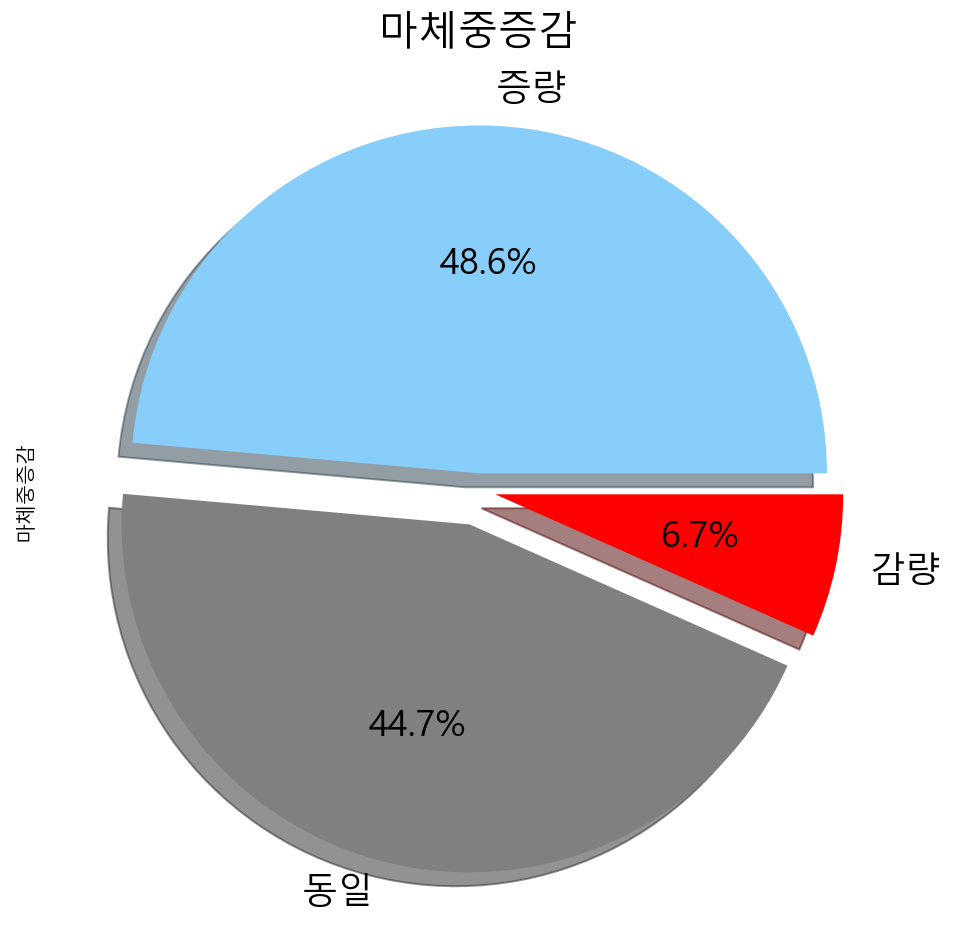

In [3]:


# 마체중증감 데이터 분포 시각화
labels = ['증량','동일', '감량']

f, ax = plt.subplots(figsize=(8,8))
df['마체중증감'].value_counts().plot.pie(explode = [0.05, 0.1, 0.05], autopct = '%1.1f%%', labels=labels,
shadow = True, colors=['lightskyblue','gray', 'red'], textprops={'fontsize':18})
plt.title('마체중증감', size=20)



Text(0.5, 1.0, '산지별 데이터')

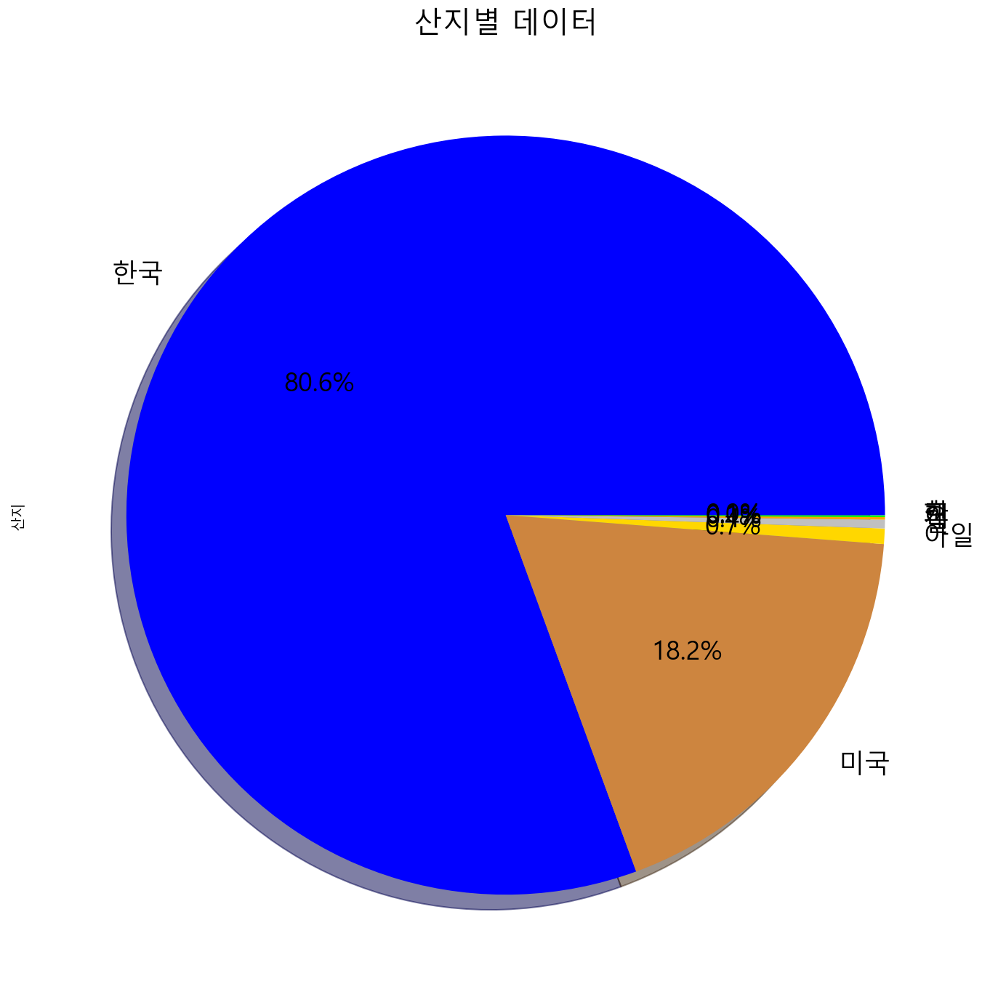

In [4]:
#산지별 데이터 분포 시각화
labels = ['한국','미국', '아일','일','캐','한','호']

f, ax = plt.subplots(figsize=(12,12))
df['산지'].value_counts().plot.pie(autopct = '%1.1f%%', labels=labels,
shadow = True, colors=['blue','peru', 'gold','silver','orange','lime'], 
                                 textprops={'fontsize':18})
plt.title('산지별 데이터', size=20)


#글자 간격 조정 필요 !!!!!!!ㅠㅠ
# 어떻게해야하는지 알아보기.


<AxesSubplot:xlabel='연령', ylabel='count'>

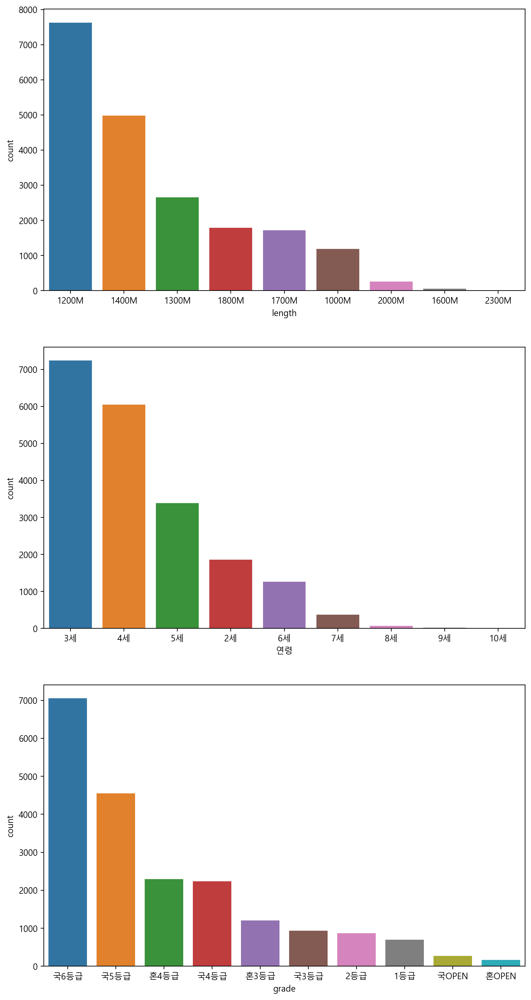

In [46]:
fig = plt.figure(figsize=(10,20))

ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(3,1,3)

sns.countplot(x="length", data=df, order=df['length'].value_counts().index, ax=ax1)
sns.countplot(x="grade", data=df, order=df['grade'].value_counts().index, ax=ax3)
sns.countplot(x="연령", data=df, order=df['연령'].value_counts().index, ax=ax2)

<AxesSubplot:xlabel='연령', ylabel='count'>

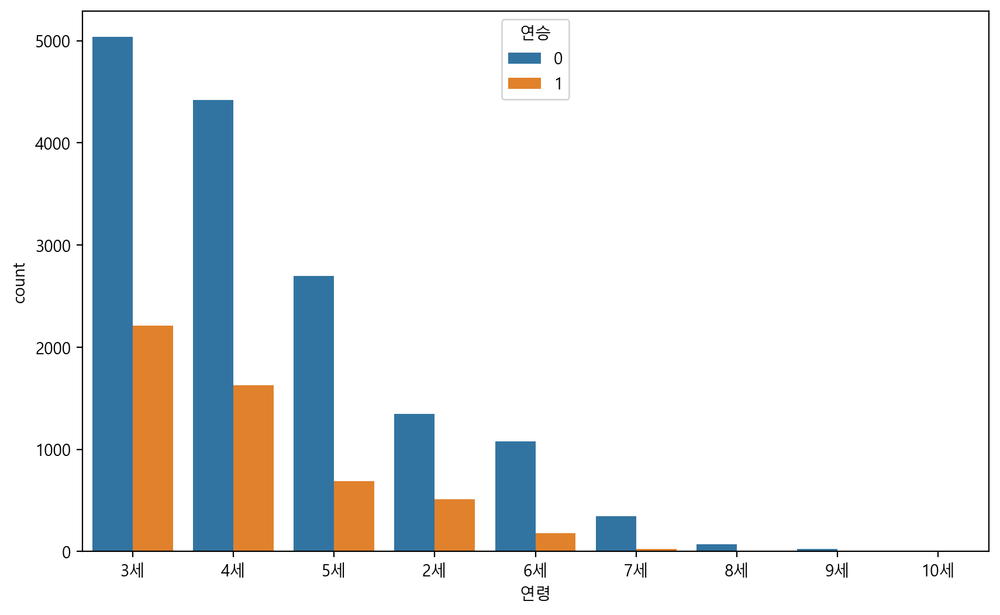

In [12]:
#연령별 연승

# 한글폰트 
plt.rc('font', family='Malgun Gothic')
plt.rc('axes', unicode_minus=False)

# 글씨 선명하게 출력하는 설정
%config InlineBackend.figure_format = 'retina'


fig = plt.figure(figsize=(10,6))


sns.countplot(x="연령", data=df, order=df['연령'].value_counts().index, hue='연승')

In [ ]:
# 201844010 김태훈 추가

<AxesSubplot:xlabel='중량', ylabel='count'>

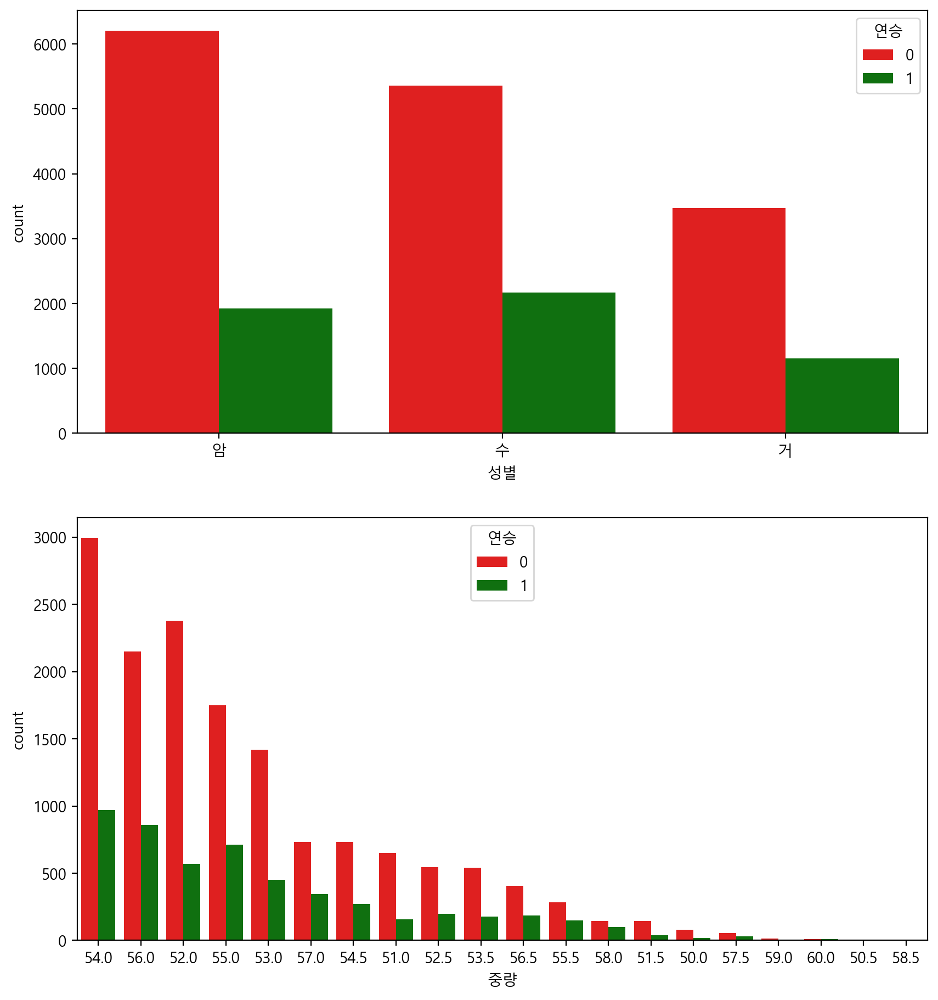

In [286]:
#말 성별 연승 
#기수 중량에 따른 연승 

# 한글폰트 
plt.rc('font', family='Malgun Gothic')
plt.rc('axes', unicode_minus=False)

customPalette = sns.set_palette(sns.color_palette(['Red', 'Green']))

# 글씨 선명하게 출력하는 설정
%config InlineBackend.figure_format = 'retina'

sns.countplot(x="length", data=df, order=df['length'].value_counts().index, ax=ax1)
fig = plt.figure(figsize=(10,17))
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)

#############################################

#1 말 성별에 따른 연승 시각화
sns.countplot(x="성별", data=df, order=df['성별'].value_counts().index, hue='연승',ax=ax1)

#2 기수 중량에 따른 연승 시각화
sns.countplot(x="중량", data=df, order=df['중량'].value_counts().index, hue='연승', ax=ax2
              
              

<AxesSubplot:xlabel='연령', ylabel='money'>

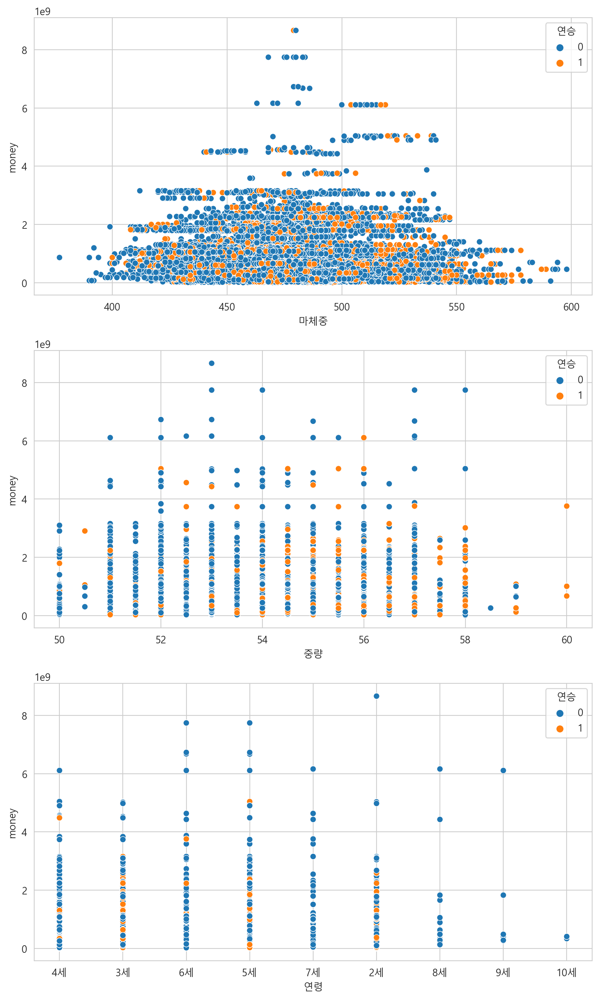

In [15]:
fig = plt.figure(figsize=(10,17))
ax1 = fig.add_subplot(3,1,1)
ax2 = fig.add_subplot(3,1,2)
ax3 = fig.add_subplot(3,1,3)

#3 마체중에 따른 연승별 수입 시각화
sns.scatterplot(data=df, x='마체중',y='money', ax=ax1, hue='연승')

#4 기수 체중에 따른 연승별 수입 시각화
sns.scatterplot(data=df, x='중량',y='money', ax=ax2, hue='연승')

#5 말 나이에 따른 연승별 수입 시각화
sns.scatterplot(data=df,x='연령', y='money', ax=ax3, hue='연승')


<AxesSubplot:xlabel='grade', ylabel='money'>

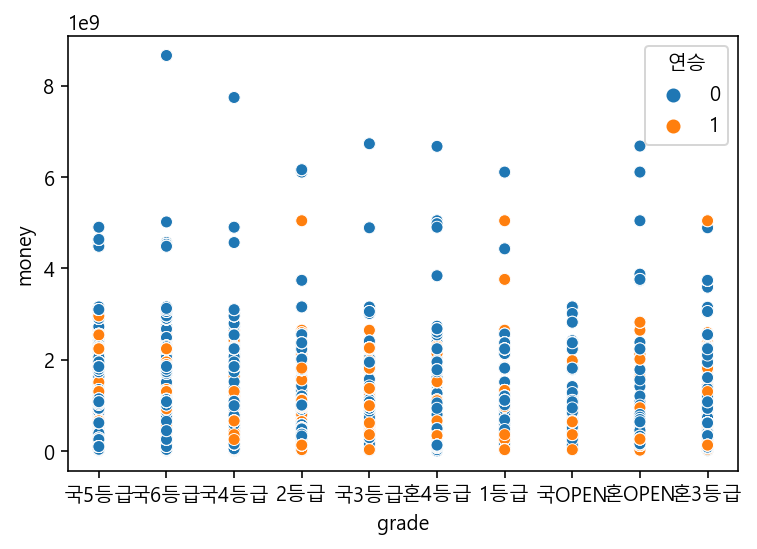

In [5]:
#6 말 등급별 연승 시각화 
sns.scatterplot(data=df,x='grade', y='money', hue='연승')

In [6]:
############### juypter 에서 PLOTLY 사용하려면 밑에 꼭 실행 할것!!!!!!!!!!######################
# 필요한 라이브러리 불러오기
import plotly.offline as pyo
import plotly.graph_objs as go

# 오프라인 모드로 변경하기
pyo.init_notebook_mode()
########################################

In [7]:
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=[1,2,3], y=[4,2,1], mode='lines'))
# fig.show()

#7 등급별 연승 시각화

fig=px.bar(df, x='연승', y='grade', color='grade', 
           color_continuous_scale=px.colors.diverging.Spectral)
fig.update_layout(width=700)



In [8]:
#8 연령 별 연승 시각화
fig=px.bar(df, x='연승', y='연령', color='연령', 
           color_continuous_scale=px.colors.diverging.Spectral)
fig.update_layout(width=700)

fig = px.scatter(df, x="temperature", y="rain", animation_frame="year", animation_group="month",
size="humidity", color="dust")
fig["layout"].pop("updatemenus") # optional, drop animation buttons
fig.update_layout(width=900,height=650)
fig.show()



ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['idx', '연승', '마명', '산지', '성별', '연령', '중량', '기수명', '마체중', '단승배당', '연승배당', 'grade', 'length', 'date', '데뷔일자', '경주마1등', '경주마2등', '경주마3등', '경주마총전적', '경주마3등이내횟수', '경주마3등이내확률', '기수1등', '기수2등', '기수3등', '기수총전적', '기수3등이내횟수', '기수3등이내확률', '마체중증감', 'money'] but received: temperature

In [ ]:
# 2022/11/25 21:00 ~ 11/26 05:00 까지 작업 완료....
# 차후 PLOTLY 더 추가하겠슴니다.
